Notes:

1. This script is written to illustrate the optimization techniques behind some Machine Learning algorithms.

2. I divided the script in to two main parts: 
    1. Regression models applied to the student performance data set:
        1. Linear Regression including Built-in Sklearn, Batch Gradient Descent and Stochastic Gradient Descent.
        2. Decision Trees- Regression
    2. Classification models applied to the White-Red Wine datasets:
        1. Logistic and Softmax Regression
        2. Support Vector Machine
        3. Decision Trees- Classification


# Importing Data

In [194]:
# Importing necessary libraries.

import os
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from matplotlib import rcParams


from sklearn.linear_model import LinearRegression, SGDRegressor, LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score , GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score,balanced_accuracy_score
from sklearn.metrics import f1_score,confusion_matrix,log_loss,recall_score,precision_score

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor, plot_tree
from sklearn.svm import SVC 


%matplotlib inline
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # excute and output mutliple code lines in the same cell

In [196]:
# Show all the contents of a cell.

from IPython.display import display, HTML

pd.set_option('display.max_colwidth', None)
display(HTML("<style>.dataframe td { text-align: left; }</style>"))

$\;\;\;\;\;\;$

$\;\;\;\;\;\;$

# Regression - Student Performance

In [201]:
# Creating student performance DataFrame.

stu_per_PATH = os.path.join('Student_Performance.csv')
stu_per = pd.read_csv(stu_per_PATH)
stu_per.tail(5)

,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
9995,1,49,Yes,4,2,23.0
9996,7,64,Yes,8,5,58.0
9997,6,83,Yes,8,5,74.0
9998,9,97,Yes,7,0,95.0
9999,7,74,No,8,1,64.0


$\;\;\;\;\;\;$

## Exploratory Data Analysis (EDA) - Student Performance

In [12]:
# Checking for duplicates

stu_per.duplicated().sum()

127

In [13]:
# Dropping duplicated data

stu_per.drop_duplicates(ignore_index=True, inplace=True)

In [14]:
stu_per.describe()
stu_per.info()

,Hours Studied,Previous Scores,Sleep Hours,Sample Question Papers Practiced,Performance Index
count,9873.000000,9873.000000,9873.000000,9873.000000,9873.000000
mean,4.992100,69.441102,6.531652,4.583004,55.216651
std,2.589081,17.325601,1.697683,2.867202,19.208570
min,1.000000,40.000000,4.000000,0.000000,10.000000
25%,3.000000,54.000000,5.000000,2.000000,40.000000
50%,5.000000,69.000000,7.000000,5.000000,55.000000
75%,7.000000,85.000000,8.000000,7.000000,70.000000
max,9.000000,99.000000,9.000000,9.000000,100.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9873 entries, 0 to 9872
Data columns (total 6 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Hours Studied                     9873 non-null   int64  
 1   Previous Scores                   9873 non-null   int64  
 2   Extracurricular Activities        9873 non-null   object 
 3   Sleep Hours                       9873 non-null   int64  
 4   Sample Question Papers Practiced  9873 non-null   int64  
 5   Performance Index                 9873 non-null   float64
dtypes: float64(1), int64(4), object(1)
memory usage: 462.9+ KB


In [15]:
# Encoding Categorical Variable.

stu_per['Extracurricular Activities'].unique()
stu_per['Extracurricular Activities']= stu_per['Extracurricular Activities'].map({'Yes':1, 'No':0})

array(['Yes', 'No'], dtype=object)

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/1684755114.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data = stu_per,x = stu_per['Hours Studied'], ax=ax1, palette= 'Set2')


<Axes: xlabel='Hours Studied', ylabel='count'>

Text(0.5, 0, 'Hours Studied')

Text(0, 0.5, 'count')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/1684755114.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data = stu_per,x = stu_per['Sleep Hours'], ax=ax2, palette='Set2')


<Axes: xlabel='Sleep Hours', ylabel='count'>

Text(0.5, 0, 'Sleep Hours')

Text(0, 0.5, 'count')

<Axes: xlabel='Hours Studied', ylabel='Performance Index'>

Text(0.5, 0, 'Hours Studied')

Text(0, 0.5, 'Performance Index')

<Axes: xlabel='Hours Studied', ylabel='Performance Index'>

Text(0.5, 0, 'Hours Studied')

Text(0, 0.5, 'Performance Index')

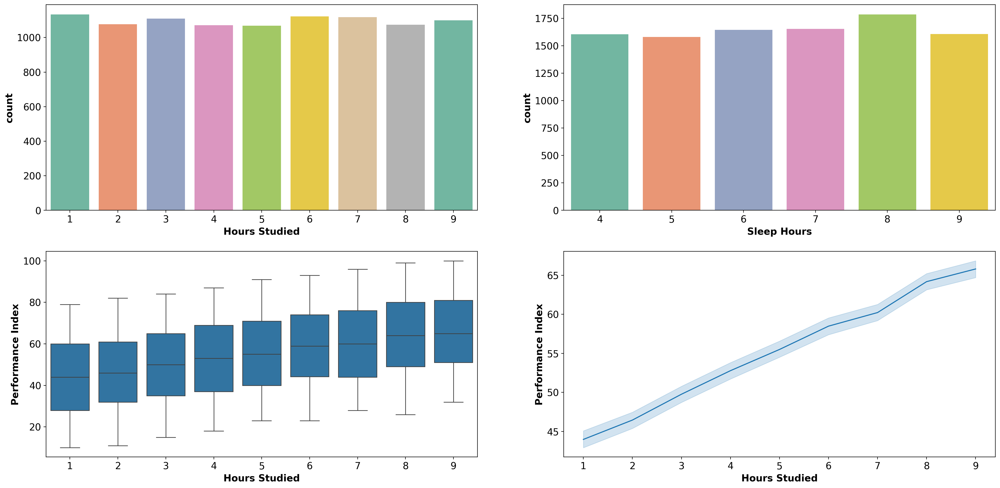

In [16]:
# Uni and bivariate visualizations

fig, ((ax1,ax2), (ax3,ax4))= plt.subplots(2,2, figsize=(25,12), dpi = 200)

sns.countplot(data = stu_per,x = stu_per['Hours Studied'], ax=ax1, palette= 'Set2')
ax1.set_xlabel('Hours Studied', fontsize = 14, weight= 'bold')
ax1.set_ylabel('count', fontsize = 14, weight= 'bold')
ax1.tick_params(axis='both', labelsize=14)

sns.countplot(data = stu_per,x = stu_per['Sleep Hours'], ax=ax2, palette='Set2')
ax2.set_xlabel('Sleep Hours', fontsize = 14, weight= 'bold')
ax2.set_ylabel('count', fontsize = 14, weight= 'bold')
ax2.tick_params(axis='both', labelsize=14)

sns.boxplot(data=stu_per ,x = 'Hours Studied',y= 'Performance Index', ax = ax3)
ax3.set_xlabel('Hours Studied', fontsize = 14, weight= 'bold')
ax3.set_ylabel('Performance Index', fontsize = 14, weight= 'bold')
ax3.tick_params(axis='both', labelsize=14)

sns.lineplot(data=stu_per, x= 'Hours Studied', y= 'Performance Index', ax= ax4)
ax4.set_xlabel('Hours Studied', fontsize = 14, weight= 'bold')
ax4.set_ylabel('Performance Index', fontsize = 14, weight= 'bold')
ax4.tick_params(axis='both', labelsize=14)   

In [17]:
# we notice from the first row that each student spend almost the same time in studying and sleeping.
# The box and line plot proves that performance index increases when more time is spent in studying.


<Axes: >

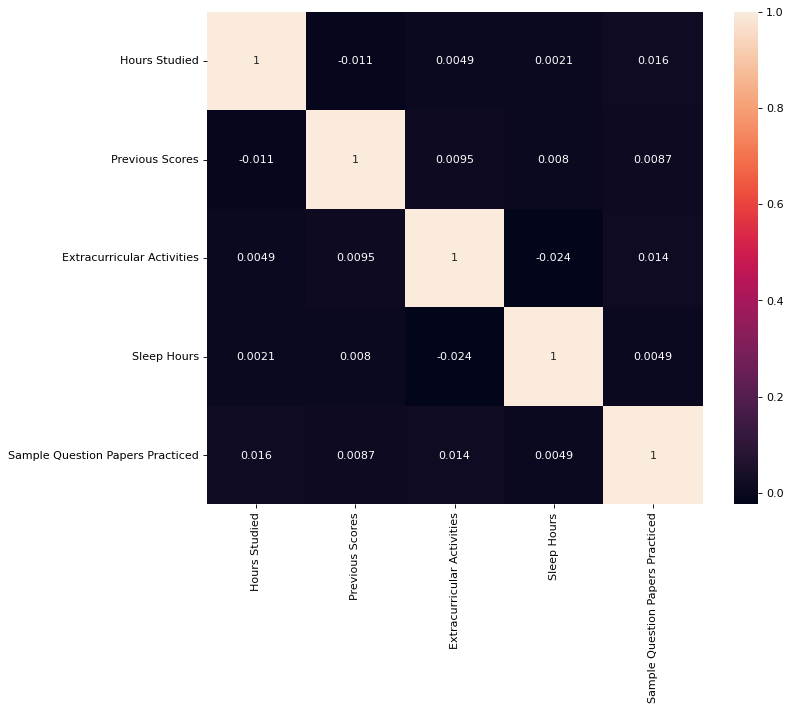

In [18]:
# Heat map to check for correlation between variables(multicollinearity)

fig, ax = plt.subplots(figsize = (10,8), dpi = 80)
sns.heatmap(stu_per.corr().iloc[:-1,:-1], annot=True, cmap= 'rocket', ax=ax)

In [19]:
# No Correlation detected, which is good.

$\;\;\;\;\;\;$

## Linear Regression

In [22]:
#we will first use the built-in sklearn regression model, and then try to implement 
#the Gradient Descent using the equations in the research paper.

In [23]:
# Preprocessing and splitting.

X_stu = stu_per.iloc[:,:-1].values
y_stu = stu_per.iloc[:,-1].values

# Standardizing the data(mean=0, std=1).
scaler = StandardScaler()
X_s = scaler.fit_transform(X_stu)


# Add a column of ones to X_standarized to account for the intercept term.
X_s = np.c_[np.ones((X_s.shape[0], 1)), X_s]


# Splitting the dataset into train and test data.
X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(X_s, y_stu, test_size=0.3, random_state=42)

$\;\;\;\;\;\;$

### Built-in  sklearn Linear Regression

In [26]:
# Using Built-in Sklearn to build a Linear Regression Model

lreg= LinearRegression()
lreg.fit(X_train_s,y_train_s)

lreg.intercept_ 
lreg.coef_

LinearRegression()

55.19600128849011

array([ 0.        ,  7.37654343, 17.64067149,  0.27840876,  0.79787291,
        0.55446661])

In [27]:
#According to the results shown, the multiple Linear Regression equation has the following form:

#Student Performance = 7.37×Hours Studied + 17.64×Previous Scores + 0.28×Extracurricular Activities +
#0.78×Sleep Hours + 0.55×Sample Question Papers Practiced + 55.2

In [28]:
# Checking the performance of Regression model

y_pred_reg= lreg.predict(X_test_s)

r2 = r2_score(y_test_s,y_pred_reg)
mse = mean_squared_error(y_test_s,y_pred_reg)

print('Mean Squared Error : ', mse)
print('R Square : ', r2)

Mean Squared Error :  4.326180232071962
R Square :  0.9881593003934889


$\;\;\;\;\;\;$

###  Batch Gradient Descent - Linear Regression implementation

In [31]:
# Using the whole data set as a batch to derive the gradient.
# Using both equations 2 and 3 in the research paper to derive the optimized parameters.

m = X_s.shape[0]
parameters_batch= np.random.rand(6,1)  # Parameters initialization


for _  in range(1000):
    grad_v1= 2/m * X_s.T@(X_s@parameters_batch - y_stu.reshape((m,-1))) # Equation 2 in essay
    parameters_batch -=  0.1 * grad_v1 # Equation 3 in essay
    
parameters_batch

array([[55.21665147],
       [ 7.38557154],
       [17.6421032 ],
       [ 0.30833122],
       [ 0.81539188],
       [ 0.55595105]])

In [32]:
# The values for cofficients and intercept almost match those calculated using the built-in Sklearn model

$\;\;\;\;\;\;$

###  Stochastic Gradient Descent -  Linear Regression implementation

In [35]:
# Picking up a sample (x_sample,y_sample) at random to derive the gradient, and reduce to learning rate exponentialy 
#to reach the solution

parameters_sgd= np.random.randn(6,1)
initial_rate= 0.1
decay_rate= 0.1

def exponential_decay(epoch, initial_rate=0.1, decay_rate=0.1):
    '''reduce the learning rate exponentialy to avoid
    missing the optimized parameters
    '''
    return initial_rate * np.exp(-decay_rate * epoch)


for iteration in range(50):# iterate 50 times over the entire dataset
    for i in range(1000):
        idx = np.random.choice(a= X_s.shape[0], size=1,replace = False)
        x_sample = X_s[idx]
        y_sample= y_stu[idx]
        grad_v2 = 2 * x_sample.T@(x_sample@parameters_sgd - y_sample)# Equation 2 in essay
        rate = exponential_decay(epoch=iteration)
        parameters_sgd -=  rate * grad_v2 #Equation 3 in essay
           
    
parameters_sgd

array([[55.10192454],
       [ 7.45971711],
       [17.63761379],
       [ 0.28343618],
       [ 0.8288057 ],
       [ 0.49755156]])

In [36]:
# The values for cofficients and intercept almost match those found in the built-in Sklearn model and the Batch
# Gradient Descent algorithm

$\;\;\;\;\;\;$

### Mini-Batch Gradient Descent -  Linear Regression implementation

In [39]:
# Pick up a sample (x_sample,y_sample) of 100 instances at random to derive the gradient, and reduce to learning
#rate exponentialy to reach the optimized solution.

parameters_mbatch= np.random.randn(6,1)
initial_rate= 0.1
decay_rate= 0.1

def exponential_decay(epoch, initial_rate=0.1, decay_rate=0.1):
    '''reduce the learning rate exponentialy to avoid
    missing the optimized parameters
    '''
    return initial_rate * np.exp(-decay_rate * epoch)

       
for epoch in range(100):
    shuffled_indices = np.random.permutation(len(X_s))
    X_b_shuffled = X_s[shuffled_indices]
    y_shuffled = y_stu[shuffled_indices]
    for i in range(0,len(X_s), 100):
        Xi = X_b_shuffled[i: i+100]
        yi= y_shuffled[i:i+100] 
        grad_v3 = (2/100) * Xi.T@(Xi@parameters_mbatch - yi.reshape((-1,1)))# Equation 2 in essay
        rate = exponential_decay(epoch=i)
        parameters_mbatch -=  rate * grad_v3 #Equation 3 in essay
        
    
parameters_mbatch


array([[55.28399434],
       [ 7.355984  ],
       [17.71670347],
       [ 0.32830699],
       [ 0.80005063],
       [ 0.48315724]])

In [40]:
# The values for cofficients and intercept almost match those found in the built-in Sklearn model, Batch
# Gradient Descent algorithm and the Stochastic Gradient Descent algorithm

$\;\;\;\;\;\;$

## Decision Trees - Regression

In [43]:
# Applying Grid Search cross validation to find the best 'max_depth' hyper-parameter.

para_rtree = {'max_depth':[2,3,4,5,6,7,8,9,10]}

gsearch_rtree = GridSearchCV(DecisionTreeRegressor(random_state=42), param_grid=para_rtree, cv = 5)
gsearch_rtree.fit(X_train_s, y_train_s)

gsearch_rtree.best_params_
gsearch_rtree.best_score_

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=42),
             param_grid={'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10]})

{'max_depth': 9}

0.9824238818919786

In [44]:
# Using Built-in Sklearn to build a Regression Decision Tree Model

rtree= DecisionTreeRegressor(criterion='squared_error', max_depth = 9)
rtree.fit(X_train_s, y_train_s)

DecisionTreeRegressor(max_depth=9)

In [45]:
# Checking the performance of Regression Tree model

y_pred_rtree= rtree.predict(X_test_s)

r2_rtree = r2_score(y_test_s,y_pred_rtree)
mse_rtree = mean_squared_error(y_test_s, y_pred_rtree)

print('Mean Squared Error : ', mse_rtree)
print('R Square : ', r2_rtree)

Mean Squared Error :  6.487891953994864
R Square :  0.9822427232371774


$\;\;\;\;\;\;$

In [47]:
# building a second model with 'max_depth'=3 for visualization purposes.

rtree_2= DecisionTreeRegressor(criterion='squared_error', max_depth = 3)
rtree_2.fit(X_train_s, y_train_s)

DecisionTreeRegressor(max_depth=3)

[Text(0.5, 0.875, 'x[2] <= 0.003\nsquared_error = 370.4\nsamples = 6911\nvalue = 55.082'),
 Text(0.25, 0.625, 'x[2] <= -0.92\nsquared_error = 134.188\nsamples = 3493\nvalue = 39.855'),
 Text(0.125, 0.375, 'x[1] <= -0.19\nsquared_error = 79.309\nsamples = 1604\nvalue = 31.748'),
 Text(0.0625, 0.125, 'squared_error = 33.069\nsamples = 727\nvalue = 24.527'),
 Text(0.1875, 0.125, 'squared_error = 38.578\nsamples = 877\nvalue = 37.734'),
 Text(0.375, 0.375, 'x[1] <= -0.19\nsquared_error = 77.585\nsamples = 1889\nvalue = 46.74'),
 Text(0.3125, 0.125, 'squared_error = 37.186\nsamples = 844\nvalue = 39.949'),
 Text(0.4375, 0.125, 'squared_error = 42.893\nsamples = 1045\nvalue = 52.224'),
 Text(0.75, 0.625, 'x[2] <= 0.811\nsquared_error = 132.695\nsamples = 3418\nvalue = 70.644'),
 Text(0.625, 0.375, 'x[1] <= 0.196\nsquared_error = 74.014\nsamples = 1560\nvalue = 62.508'),
 Text(0.5625, 0.125, 'squared_error = 36.521\nsamples = 861\nvalue = 56.893'),
 Text(0.6875, 0.125, 'squared_error = 33.52\

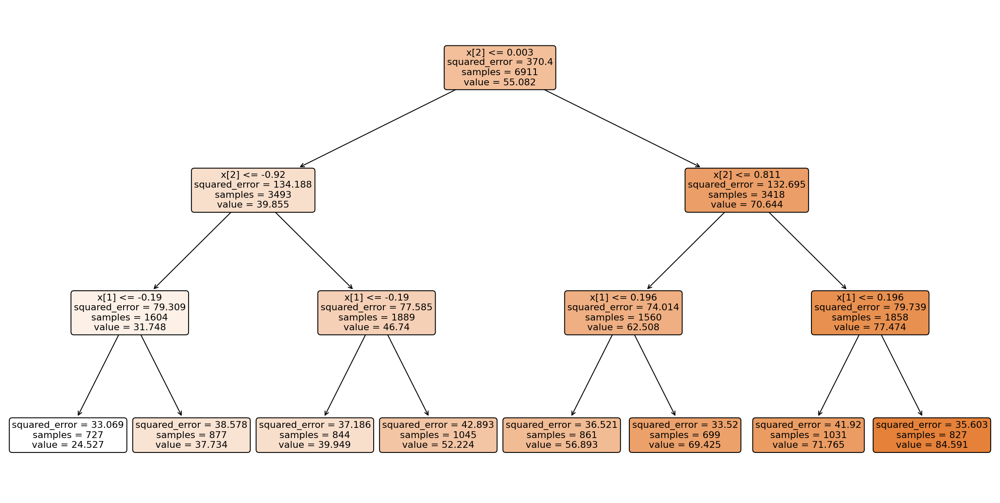

In [48]:
fig, ax = plt.subplots(figsize = (20,10), dpi = 150)
plot_tree(rtree_2,filled= True, rounded=True, ax=ax )

### Regression Tree implementation

In [50]:
class DecisionTreeReg:
    def __init__(self, max_depth=None, min_samples_split=30):
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split

    def grow_tree(self, X, y, depth=0):
        n_samples, n_features = X.shape

        # If not enough samples or max depth reached, return the mean of y
        if n_samples < self.min_samples_split or  depth >= self.max_depth:
            return {'value': np.mean(y)}

        best_mse = float('inf')
        best_split = None
        best_left = None
        best_right = None

        def mean_squared_error(left, right):
            total_len = len(left) + len(right)
            if total_len == 0:
                return 0

            left_mean = np.mean(left)
            right_mean = np.mean(right)
            mse_left = np.mean((left - left_mean) ** 2)  
            mse_right = np.mean((right - right_mean) ** 2)
            weighted_mse = (len(left) / total_len) * mse_left + (len(right) / total_len) * mse_right  ## Equation 10 in essay

            return weighted_mse

        for feature in range(n_features):
            values = np.unique(X[:, feature])
            for t in values:
                left_indices = X[:, feature] <= t
                right_indices = X[:, feature] > t
                y_left = y[left_indices]
                y_right = y[right_indices]


                mse = mean_squared_error(y_left, y_right)
                if mse < best_mse:
                    best_mse = mse
                    best_split = (t, feature)
                    best_left = (y_left, left_indices)
                    best_right = (y_right, right_indices)

        if best_split is None:
            return {'value': np.mean(y)}

        left_tree = self.grow_tree(X[best_left[1]], best_left[0], depth + 1)
        right_tree = self.grow_tree(X[best_right[1]], best_right[0], depth + 1)

        return {'feature': best_split[1],
                'value': best_split[0],
                'left': left_tree,
                'right': right_tree,
                'depth': depth}

In [51]:
tree_reg = DecisionTreeReg(max_depth=3)


In [52]:
# The threshold values choosen by the implemnted Tree almost matches those from the built-in Regression Tree

tree_reg.grow_tree(X_train_s,y_train_s)

/Users/salahjtaleb/opt/anaconda3/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/salahjtaleb/opt/anaconda3/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


{'feature': 2,
 'value': -0.02546083852543923,
 'left': {'feature': 2,
  'value': -0.9489964849517473,
  'left': {'feature': 1,
   'value': -0.38320541512537754,
   'left': {'value': 24.526822558459422},
   'right': {'value': 37.734321550741164},
   'depth': 2},
  'right': {'feature': 1,
   'value': -0.38320541512537754,
   'left': {'value': 39.949052132701425},
   'right': {'value': 52.22392344497608},
   'depth': 2},
  'depth': 1},
 'right': {'feature': 2,
  'value': 0.7826328520975803,
  'left': {'feature': 1,
   'value': 0.0030515592016109113,
   'left': {'value': 56.8931475029036},
   'right': {'value': 69.42489270386267},
   'depth': 2},
  'right': {'feature': 1,
   'value': 0.0030515592016109113,
   'left': {'value': 71.76527643064985},
   'right': {'value': 84.5912938331318},
   'depth': 2},
  'depth': 1},
 'depth': 0}

$\;\;\;\;\;\;$

$\;\;\;\;\;\;$

# Classification - Wine

In [203]:
# Red and White wine data-set used for Classification models.
# Preparing the Dataframe

red_wine_PATH = os.path.join('winequality-red.csv')

white_wine_PATH = os.path.join('winequality-white.csv')

red_wine_ds= pd.read_csv(red_wine_PATH,sep = ';' )
white_wine_ds =pd.read_csv(white_wine_PATH,sep = ';' )

red_wine_ds.tail(5)
white_wine_ds.tail(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5
1598,6.0,0.310,0.47,3.6,0.067,18.0,42.0,0.99549,3.39,0.66,11.0,6


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7
4897,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6


In [205]:
# Adding 'wine type' column to eventually distinguish between red and white wine after we concatenate the 2 datasets.

red_wine_ds['wine type'] = 0
white_wine_ds['wine type'] = 1

In [207]:
# Concatenating the red and wine DataFrames.

wine_df = pd.concat([red_wine_ds, white_wine_ds], ignore_index=True)
wine_df= wine_df.reindex(columns=['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'wine type','quality'])
wine_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,wine type,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,0,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,0,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,0,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,1,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,1,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1,7


In [59]:
# Preprocressing and Splitting.

X_wine= wine_df.iloc[:,:-1].values
y_wine= wine_df.iloc[:,-1].values

scaler = StandardScaler()
X_w= scaler.fit_transform(X_wine) 

X_train_w, X_test_w, y_train_w, y_test_w = train_test_split(X_w, y_wine, test_size=0.3, random_state=42, 
                                                        shuffle=True, stratify=y_wine)

#X_train_w, X_test_w, y_train_w, y_test_w = train_test_split(X_wine, y_wine,test_size=0.3, random_state=42, 
 #                                                       shuffle=True, stratify=y_wine)

$\;\;\;\;\;\;$

## Exploratory Data Analysis (EDA) - wine

In [62]:
wine_df['quality'].value_counts()

quality
6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: count, dtype: int64

In [63]:
# Checking for duplicates

wine_df[wine_df.duplicated()]['wine type'].value_counts()

wine type
1    937
0    240
Name: count, dtype: int64

In [64]:
# Dropping duplicated data

wine_df.drop_duplicates(ignore_index=True, inplace = True)

In [65]:
# There are no null values, and all the variables are numerical (float),which what we want inorder to proceed 
#to the machine learning part. 

wine_df.describe()
wine_df.info()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,wine type,quality
count,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000
mean,7.215179,0.344130,0.318494,5.048477,0.056690,30.036654,114.109023,0.994535,3.224664,0.533357,10.549241,0.744549,5.795677
std,1.319671,0.168248,0.147157,4.500180,0.036863,17.805045,56.774223,0.002966,0.160379,0.149743,1.185933,0.436155,0.879772
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,0.000000,3.000000
25%,6.400000,0.230000,0.240000,1.800000,0.038000,16.000000,74.000000,0.992200,3.110000,0.430000,9.500000,0.000000,5.000000
50%,7.000000,0.300000,0.310000,2.700000,0.047000,28.000000,116.000000,0.994650,3.210000,0.510000,10.400000,1.000000,6.000000
75%,7.700000,0.410000,0.400000,7.500000,0.066000,41.000000,153.250000,0.996770,3.330000,0.600000,11.400000,1.000000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,1.000000,9.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5320 entries, 0 to 5319
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         5320 non-null   float64
 1   volatile acidity      5320 non-null   float64
 2   citric acid           5320 non-null   float64
 3   residual sugar        5320 non-null   float64
 4   chlorides             5320 non-null   float64
 5   free sulfur dioxide   5320 non-null   float64
 6   total sulfur dioxide  5320 non-null   float64
 7   density               5320 non-null   float64
 8   pH                    5320 non-null   float64
 9   sulphates             5320 non-null   float64
 10  alcohol               5320 non-null   float64
 11  wine type             5320 non-null   int64  
 12  quality               5320 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 540.4 KB


In [66]:
# Checking the distribution of wine quality among wine sample.

wine_df['quality'].value_counts()


quality
6    2323
5    1752
7     856
4     206
8     148
3      30
9       5
Name: count, dtype: int64

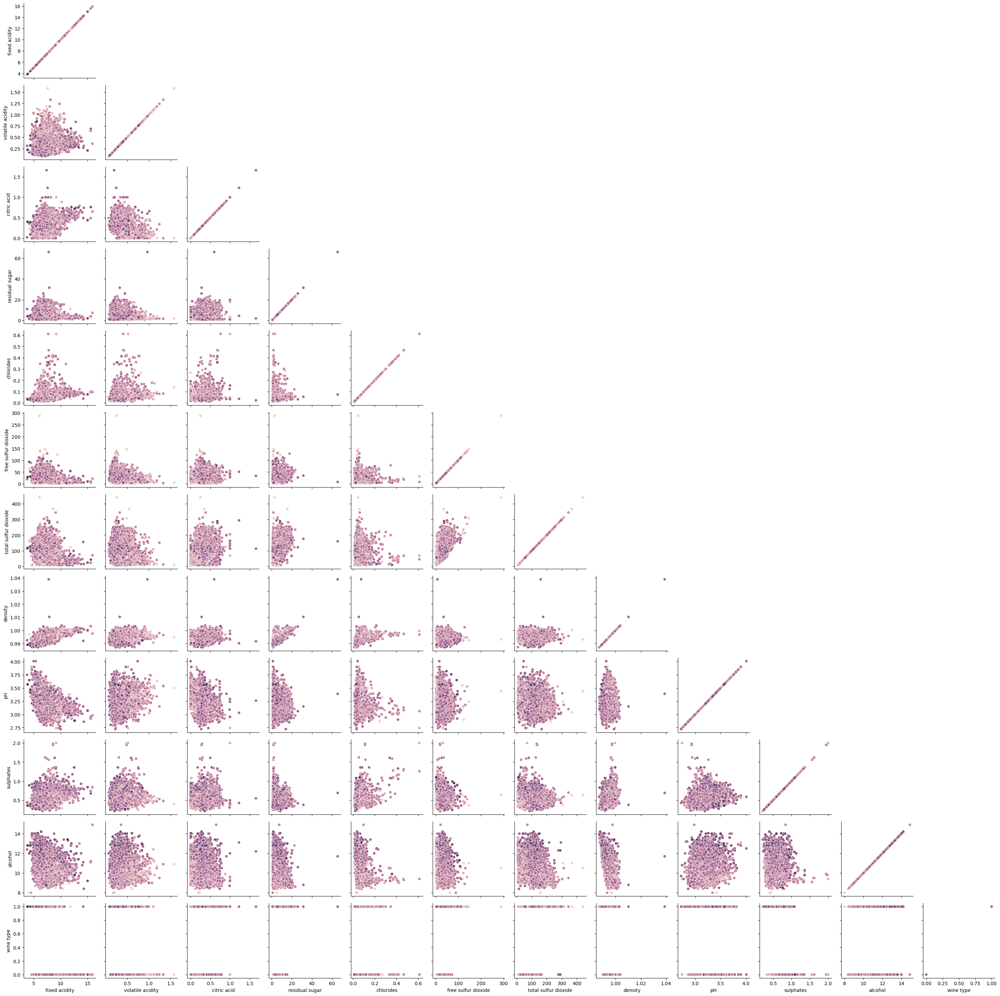

In [67]:
# Pair Plot to check for correlation between variables(multicollinearity)

variables = wine_df.columns[:-3]
pplot= sns.PairGrid(wine_df, hue = 'quality', corner = True)
pplot.map(sns.scatterplot)

<Axes: >

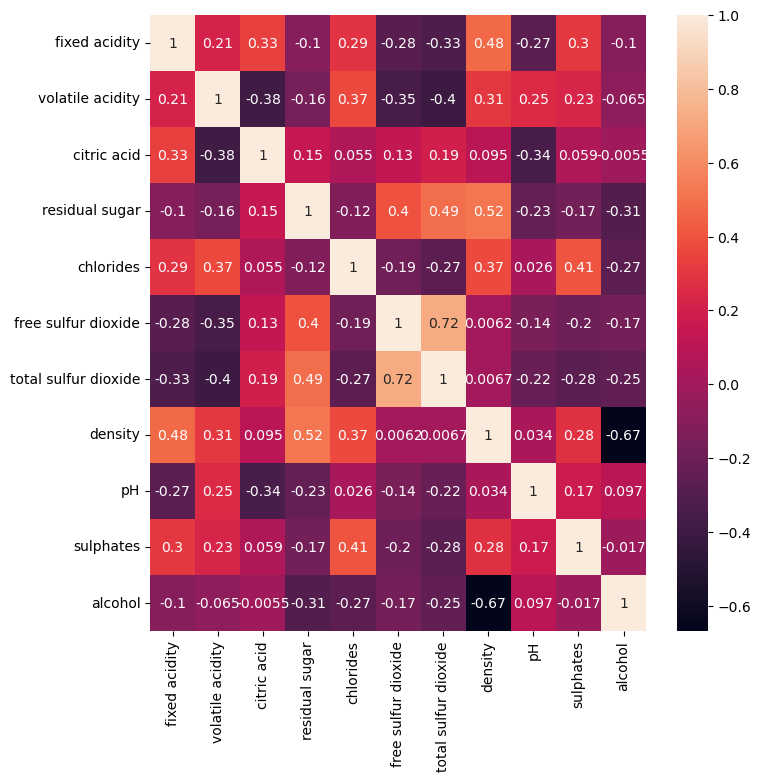

In [68]:
# Heat map to check for correlation between variables(multicollinearity)

fig, ax = plt.subplots(figsize = (8,8), dpi = 100)
sns.heatmap(wine_df.corr().iloc[:-2,:-2], annot=True, cmap= 'rocket', ax=ax)

In [69]:
# There is barely correlation among the predictors which is a good thing.

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,wine type
quality,,,,,,,,,,,,
3,7.853333,0.517000,0.281000,5.140000,0.077033,39.216667,122.033333,0.995744,3.257667,0.506333,10.215000,0.666667
4,7.304369,0.462379,0.271505,4.034951,0.060510,20.332524,101.516990,0.994802,3.235874,0.507476,10.215049,0.742718
5,7.333248,0.393970,0.305845,5.481906,0.066039,29.797660,119.572203,0.995734,3.214275,0.529041,9.872211,0.670662
6,7.169027,0.315626,0.324671,5.153142,0.054366,30.777873,114.433491,0.994377,3.224120,0.534313,10.649060,0.769694
7,7.122021,0.292342,0.336040,4.171320,0.045218,29.977220,105.157126,0.992838,3.240479,0.549638,11.511020,0.804907
8,6.820270,0.302973,0.340541,4.771622,0.040385,33.108108,111.976351,0.992130,3.239595,0.519054,11.912162,0.885135
9,7.420000,0.298000,0.386000,4.120000,0.027400,33.400000,116.000000,0.991460,3.308000,0.466000,12.180000,1.000000


/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='fixed acidity'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'fixed acidity')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='volatile acidity'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'volatile acidity')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='citric acid'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'citric acid')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='residual sugar'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'residual sugar')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='chlorides'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'chlorides')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='free sulfur dioxide'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'free sulfur dioxide')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='total sulfur dioxide'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'total sulfur dioxide')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='density'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'density')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='pH'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'pH')

/var/folders/nl/kpldl49s7v71fzcrn2cqs0pw0000gn/T/ipykernel_7690/557953081.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')


<Axes: xlabel='quality', ylabel='sulphates'>

Text(0.5, 0, 'quality')

Text(0, 0.5, 'sulphates')

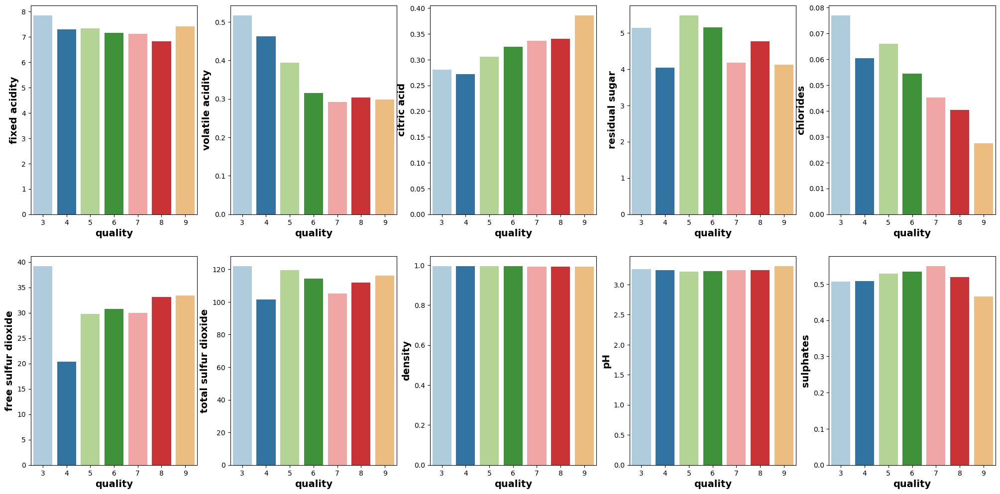

In [70]:
# Bar plots between each predictor and the response (quality)to find out if a prticular variable has
#a direkt impact on the quality of wine

fig, axes= plt.subplots(2,5, figsize=(25,12))
quality_grouped_df= wine_df.groupby('quality').mean()
quality_grouped_df

for ax, var in zip(axes.flatten(), quality_grouped_df.columns[:-1]):
    sns.barplot(data = quality_grouped_df, x =quality_grouped_df.index,y = var, ax=ax, palette='Paired')
    ax.set_xlabel('quality', fontsize = 14, weight= 'bold')
    ax.set_ylabel(var, fontsize = 14, weight= 'bold')


In [71]:
#we can notice how volatile acidity and chlorides have direct impact on wine quality (the less volatile acidity
#and chloride, the better the quality), whereas the remaining chemical components have almost no effect.

$\;\;\;\;\;\;$

## Logistic Regression

In [74]:
# since Logistic regression is a binary classifier and for illustration purposes, i will choose randomly 2 classes
# from the data set and apply the model on the filtered data set for these 2 classes.


In [75]:
# Filtering DataFrame to include only instances with quality 5 and 6 

wine_df_log= wine_df[(wine_df['quality']==5) | (wine_df['quality']==6)]
wine_df_log['quality'].value_counts()

quality
6    2323
5    1752
Name: count, dtype: int64

In [76]:
# Splitting and preprocessing.

X_log= wine_df_log.iloc[:,:-1].values
y_log= wine_df_log.iloc[:,-1].map({5:0,6:1}).values # mapping classes 5 and 6 to 0 and 1 respectively 

X_log_stan= scaler.fit_transform(X_log)


# Splitting the dataset into train and test data.
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_log_stan, y_log,
                                                                        test_size=0.3, random_state=42)


$\;\;\;\;\;\;$

 ### Built-in sklearn Logistic Regression

In [79]:
# Using Built-in Sklearn to build a Logistic Regression Model

Log_reg= LogisticRegression(C=1, tol=0.1)
Log_reg.fit(X_train_log,y_train_log)
y_pred_log=Log_reg.predict(X_test_log) 

Log_reg.coef_
Log_reg.intercept_

LogisticRegression(C=1, tol=0.1)

array([[-0.12637184, -0.41453364,  0.10694969, -0.04682078, -0.26912674,
         0.04906048, -0.07526982, -0.4273191 ,  0.02765252, -0.00666214,
         0.65147864,  0.2043076 ]])

array([0.26169304])

<Axes: >

Log-loss: 12.9969
Accuracy: 0.6394
Precision: 0.6828
Recall: 0.6739


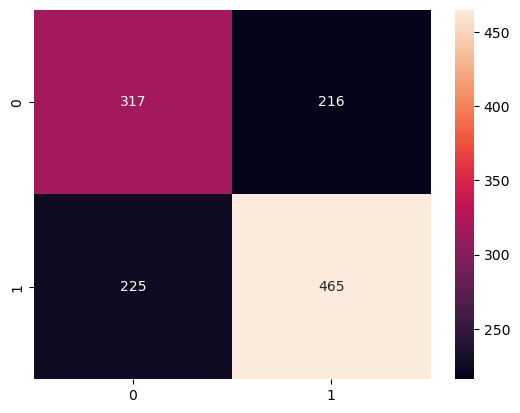

In [80]:
# Checking the performance of the built-in Sklearn Logistic Regression model

con_matrix_log=confusion_matrix(y_test_log, y_pred_log)
sns.heatmap(data =con_matrix_log,annot=True, cmap= 'rocket', fmt='.0f')

log_loss_log= log_loss(y_test_log, y_pred_log)
accuracy_log = accuracy_score(y_test_log, y_pred_log)
precision_log = precision_score(y_test_log, y_pred_log)
recall_log = recall_score(y_test_log, y_pred_log)

print(f'Log-loss: {log_loss_log:.4f}')
print(f'Accuracy: {accuracy_log:.4f}')
print(f'Precision: {precision_log:.4f}')
print(f'Recall: {recall_log:.4f}')

$\;\;\;\;\;\;$

### Batch Gradient Descent - Logistic Regression implementation

In [83]:
# splitting and preprocressing.

scaler_log = StandardScaler()
X_log_std= scaler_log.fit_transform(X_log) # Standarizing the data set
X_log_inter = np.c_[np.ones((len(X_log_std),1)), X_log_std] # adding a column of ones to account for the intercept

X_train_log_std, X_test_log_std, y_train_log_std, y_test_log_std = train_test_split(X_log_inter, y_log,
                                                                        test_size=0.3, random_state=42)

In [84]:
# Using the whole data set as a batch to derive the gradient vector.
# Using both equations 4 and 5 in the research paper to calculate the Sigmoid and Loss-Log function.


l= len(X_train_log_std)
parameters_log = np.random.rand(13,1)
cost_history_log = []

def sigmoid_func(x, parameters):   #  Equation 4 in essay - Sigomid function
    '''
    given the input array and the parameters,
    this fuction always returns values between 0 and 1 
    '''
    return  1 / (1 + np.exp(-x@parameters))

def log_loss_func(l,x,parameters,y): # Equation 5 in essay - Log-Loss function
    ''' 
    The cost function for optimizing the Logistic Regression
    '''
    return - (1/l) * np.sum(y_log * np.log(sigmoid_func(x, parameters)) + (1 - y_log) * np.log(1 - sigmoid_func(x, parameters))) #Equation 5 - Log Loss


for _  in range(500):
    predictions_log = sigmoid_func(X_train_log_std, parameters_log) # initial predictions
    
    # Calculate and update the gradient.
    grad_v4= 1/l * X_train_log_std.T@(predictions_log - y_train_log_std.reshape((l,-1))) 
    parameters_log -=  0.1 * grad_v4
    
    # Calculate and store the cost.
    cost_log= log_loss_func(l=l, x= X_train_log_std, parameters=parameters_log, y = y_train_log_std)
    cost_history_log.append(cost_log)
    
parameters_log 
   

array([[ 0.39039429],
       [ 0.06195489],
       [-0.52851418],
       [-0.05150351],
       [ 0.29952656],
       [-0.02176387],
       [ 0.2427062 ],
       [-0.34330679],
       [-0.16053608],
       [ 0.1199765 ],
       [ 0.2216616 ],
       [ 0.84422818],
       [ 0.04836188]])

<Axes: >

Text(0, 0.5, 'cost')

Text(0.5, 0, 'iterations')

Text(0.5, 1.0, 'log-loss cost')

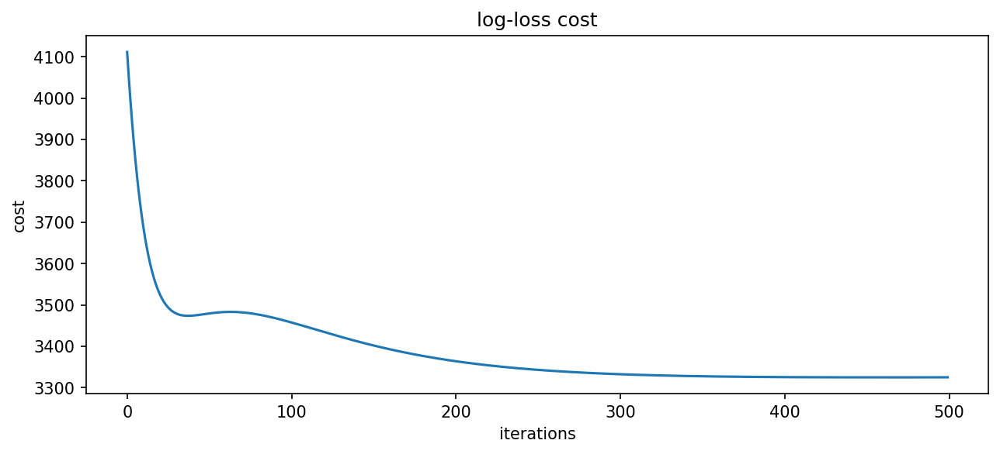

In [85]:
# The log_loss line chart

fig,ax= plt.subplots(figsize=(10,4), dpi =150) 
sns.lineplot(x=range(500), y=cost_history_log, ax=ax)
ax.set_ylabel('cost')
ax.set_xlabel('iterations')
ax.set_title('log-loss cost')


In [86]:
# For each complete iteration over the training data, 
# the parameter values get optimized and thus the loss reduces.

In [87]:
# Using the optimized parameters to do predictions

j= len(X_test_log_std)
predictions_log= sigmoid_func(X_test_log_std, parameters_log)

wine_series_pre= pd.Series(np.zeros(j))
wine_series_pre[predictions_log.ravel() >= 0.5]=1
wine_series_pre[predictions_log.ravel() < 0.5]=0

y_pred_log_2= wine_series_pre.astype('int').values

<Axes: >

Log-loss: 10.8455
Accuracy: 0.6991
Precision: 0.7102
Recall: 0.7884


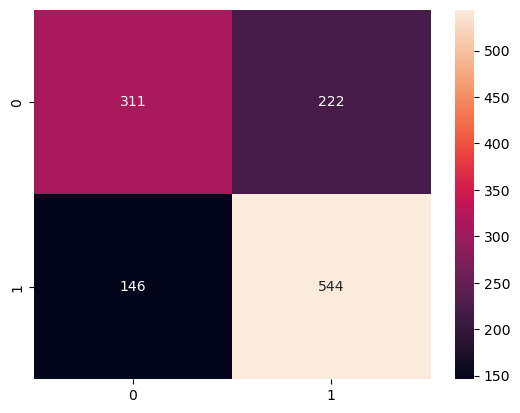

In [88]:
# Checking the performance of the second Logistic Regression model

con_matrix_log_2=confusion_matrix(y_test_log_std, y_pred_log_2)
sns.heatmap(data =con_matrix_log_2,annot=True, cmap= 'rocket', fmt='.0f')

log_loss_log_2= log_loss(y_test_log_std, y_pred_log_2)
accuracy_log_2 = accuracy_score(y_test_log_std, y_pred_log_2)
precision_log_2 = precision_score(y_test_log_std, y_pred_log_2)
recall_log_2 = recall_score(y_test_log_std, y_pred_log_2)

print(f'Log-loss: {log_loss_log_2:.4f}')
print(f'Accuracy: {accuracy_log_2:.4f}')
print(f'Precision: {precision_log_2:.4f}')
print(f'Recall: {recall_log_2:.4f}')

$\;\;\;\;\;\;$

## Softmax Regression

 ### Built-in sklearn Softmax Regression

In [92]:
# Using Built-in Sklearn to build a Logistic Regression Model

softmax_reg= LogisticRegression(multi_class ='multinomial', C=1, solver='newton-cg')
softmax_reg.fit(X_train_w,y_train_w)
y_pred_sm=softmax_reg.predict(X_test_w) 

softmax_reg.coef_
softmax_reg.intercept_

LogisticRegression(C=1, multi_class='multinomial', solver='newton-cg')

array([[ 0.60617484,  0.93044319,  0.06358323, -0.14627064,  0.5652868 ,
         0.07879845, -0.25577383, -0.02647963,  0.46096445, -0.57118922,
        -0.68639412,  0.94164376],
       [-0.23882238,  0.71822947, -0.07860414, -0.65851718,  0.16772265,
        -0.90659257,  0.18107206,  0.599622  , -0.2511182 , -0.16045839,
        -0.64172093,  0.84942305],
       [-0.65075687,  0.23723467,  0.0029836 , -0.64044892,  0.13653372,
        -0.1595664 ,  0.42820348,  0.67925166, -0.55492608, -0.1017426 ,
        -0.7431135 , -0.52131736],
       [-0.55884467, -0.45265578, -0.09450769, -0.25819813,  0.10547656,
         0.02824005,  0.06166097,  0.52728702, -0.44101928,  0.1622935 ,
         0.16120375, -0.53636081],
       [ 0.01114655, -0.83601248, -0.10154509,  0.60146973, -0.09611854,
         0.10409889, -0.00350824, -0.66947662, -0.06043386,  0.46339136,
         0.40627923, -0.83678024],
       [-0.06614907, -0.62212738, -0.11295595,  0.77822815,  0.13317634,
         0.3768725 , -

array([-2.26915976, -0.07841992,  2.55277266,  3.14039466,  1.67558187,
       -0.43290326, -4.58826624])

<Axes: >

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0.5, 0, '3'),
  Text(1.5, 0, '4'),
  Text(2.5, 0, '5'),
  Text(3.5, 0, '6'),
  Text(4.5, 0, '7'),
  Text(5.5, 0, '8'),
  Text(6.5, 0, '9')])

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, '3'),
  Text(0, 1.5, '4'),
  Text(0, 2.5, '5'),
  Text(0, 3.5, '6'),
  Text(0, 4.5, '7'),
  Text(0, 5.5, '8'),
  Text(0, 6.5, '9')])

Precision: 0.5135
Recall: 0.5277
Accuracy: 0.5277
F1-score: 0.4982


/Users/salahjtaleb/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


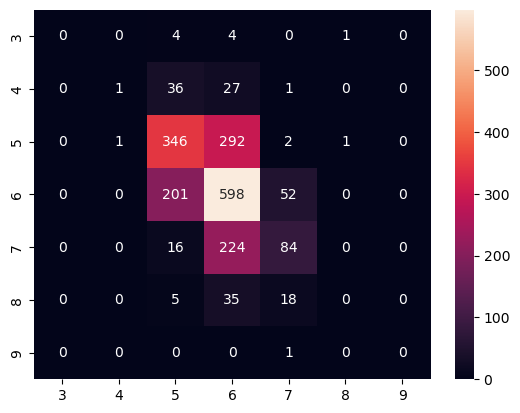

In [93]:
# Checking the performance of the built-in Sklearn Softmax Regression model

con_matrix_sm=confusion_matrix(y_test_w, y_pred_sm)
sns.heatmap(data =con_matrix_sm,annot=True, cmap= 'rocket', fmt='.0f',
            xticklabels=[3,4,5,6,7,8,9], yticklabels=[3,4,5,6,7,8,9])
plt.xticks()
plt.yticks()

precision_sm = precision_score(y_test_w, y_pred_sm, average='weighted')
recall_sm = recall_score(y_test_w, y_pred_sm, average='weighted')
accuracy_sm= accuracy_score(y_test_w, y_pred_sm)
f1_score_sm= f1_score(y_test_w, y_pred_sm,average='weighted')

print(f'Precision: {precision_sm:.4f}')
print(f'Recall: {recall_sm:.4f}')
print(f'Accuracy: {accuracy_sm:.4f}')
print(f'F1-score: {f1_score_sm:.4f}')

$\;\;\;\;\;\;$

### Softmax Regression implementation

In [96]:
# Using the whole data set as a batch to derive the gradient vector.
 

s= len(X_train_w)
classes_sm = np.unique(y_train_w)
parameters_sm = np.random.randn(len(np.unique(y_train_w)),12)
cost_history_sm= []




# One-hot encode y_train_sm
y_train_one_hot = np.zeros((s, len(classes_sm)))
for i, label in enumerate(y_train_w):
     y_train_one_hot[i, label - 3] = 1  # index starts at 0 while classes starts at 3.

        
        
for _ in range(1000):
    scores_sm= X_train_w@parameters_sm.T # initial prediction scores.
    
    # Normalizing the scores.
    exp_scores = np.exp(scores_sm - np.max(scores_sm, axis=1, keepdims=True))
    softmax_function = exp_scores / np.sum(exp_scores, axis=1, keepdims=True) #initial probability predictions
  
    # calculate and update the gradient.
    grad_v5 = -1/s * X_train_w.T@(y_train_one_hot - softmax_function)
    parameters_sm -= 0.1 * grad_v5.T
    
    # Calculate and store the cost (adding a constant to avoid log(0))
    cost_sm = -1/s * np.sum(y_train_one_hot * np.log(softmax_function + 1e-10)) # Equation 6 in essay
    cost_history_sm.append(cost_sm)

parameters_sm


array([[ 3.99693987e-01,  5.75085122e-01, -2.05262924e-01,
         1.10249474e-01,  1.94280346e-01, -6.06859385e-01,
         6.62006508e-01,  8.85434284e-01, -2.15963005e-01,
        -4.58674926e-01,  3.02435742e-01, -1.23069870e-01],
       [ 3.83879896e-01,  8.65702148e-01, -1.90140292e-01,
        -6.50262859e-02,  1.63469840e-01, -7.44444162e-01,
         5.07906183e-01,  1.04511347e+00, -2.25656003e-01,
        -4.89984851e-01,  1.38808791e-01,  3.50776321e-01],
       [ 1.93618987e-01,  1.00942829e+00, -1.56116230e-01,
        -3.95739906e-01,  1.73804033e-01, -7.02223342e-01,
         9.32131472e-01,  1.30408071e+00, -3.80291602e-01,
        -7.21814159e-01, -1.02572690e+00, -2.39193683e-01],
       [ 1.51988864e-01, -5.97135472e-01, -4.26556620e-01,
        -1.64476901e-01, -7.47360108e-02, -1.60063820e-01,
        -1.61192301e-01,  1.94309373e+00, -3.29879395e-01,
        -2.34604334e-01,  1.06723573e+00,  1.85999197e-01],
       [ 6.44099115e-01, -1.36837678e-01, -2.4117784

<Axes: >

Text(0, 0.5, 'cost')

Text(0.5, 0, 'iterations')

Text(0.5, 1.0, 'cross-entropy cost')

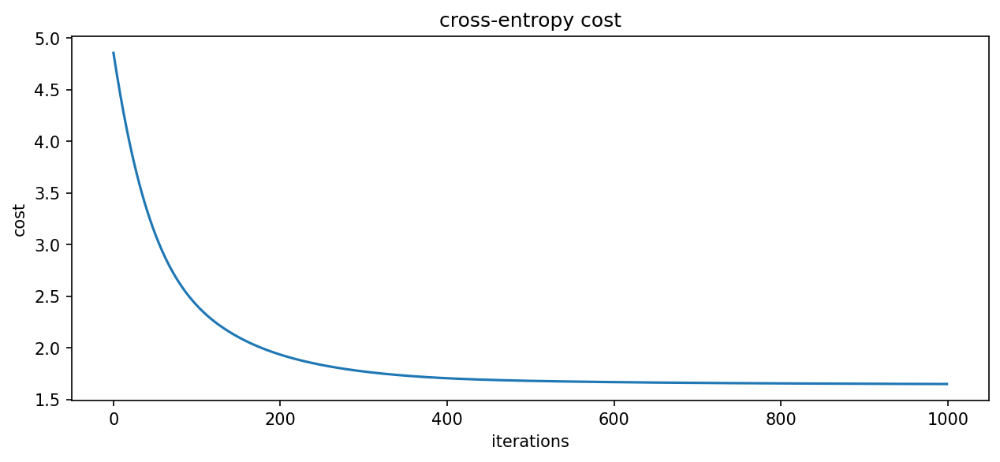

In [97]:
# The Cross-entropy cost line chart

fig,ax= plt.subplots(figsize=(10,4), dpi =150) 
sns.lineplot(x=range(1000), y=cost_history_sm, ax=ax)
ax.set_ylabel('cost')
ax.set_xlabel('iterations')
ax.set_title('cross-entropy cost')


In [98]:
# for each complete iteration over the training data, 
# the parameter values are optimized and thus the loss reduces.

In [99]:
# Using the optimized parameters to do predictions

t= len(X_test_w)
scores_test_sm= X_test_w@parameters_sm.T #Optimized parameters testing
softmax_function_test= np.exp(scores_test_sm) / np.sum(np.exp(scores_test_sm), axis =1).reshape((t,-1))

# Mapping the original indices to the predicted classes.
index_mapping = {0:3,1:4,2:5,3:6,4:7,5:8,6:9}
y_pred_sm_idx = np.argmax(softmax_function_test, axis=1) # argmax to return the index of the highest probability .
y_pred_sm_class=np.array([index_mapping[idx] for idx in y_pred_sm_idx]) # Class predictions

y_pred_sm_class

array([7, 6, 5, ..., 4, 5, 7])

<Axes: >

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0.5, 0, '3'),
  Text(1.5, 0, '4'),
  Text(2.5, 0, '5'),
  Text(3.5, 0, '6'),
  Text(4.5, 0, '7'),
  Text(5.5, 0, '8'),
  Text(6.5, 0, '9')])

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, '3'),
  Text(0, 1.5, '4'),
  Text(0, 2.5, '5'),
  Text(0, 3.5, '6'),
  Text(0, 4.5, '7'),
  Text(0, 5.5, '8'),
  Text(0, 6.5, '9')])

Precision: 0.4901
Recall: 0.4482
Accuracy: 0.4482
F1-score: 0.4265


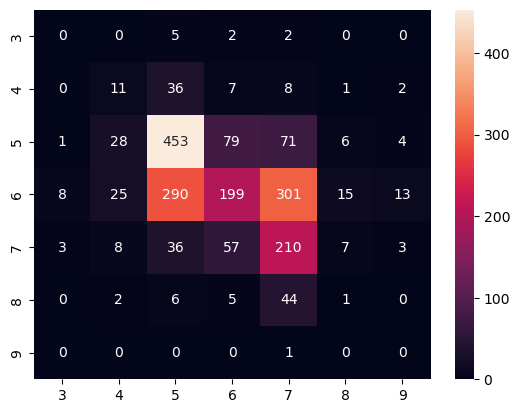

In [100]:
# Checking the performance of the second Softmax Regression model

con_matrix_sm_2=confusion_matrix(y_test_w, y_pred_sm_class)
sns.heatmap(data =con_matrix_sm_2,annot=True, cmap= 'rocket', fmt='.0f',xticklabels=[3,4,5,6,7,8,9], 
            yticklabels=[3,4,5,6,7,8,9])
plt.xticks()
plt.yticks()

precision_sm_2 = precision_score(y_test_w, y_pred_sm_class, average='weighted')
recall_sm_2 = recall_score(y_test_w, y_pred_sm_class, average='weighted')
accuracy_sm_2= accuracy_score(y_test_w, y_pred_sm_class)
f1_score_sm_2= f1_score(y_test_w, y_pred_sm_class,average='weighted')

#print(f'Log-loss: {log_loss_sm:.4f}')
print(f'Precision: {precision_sm_2:.4f}')
print(f'Recall: {recall_sm_2:.4f}')
print(f'Accuracy: {accuracy_sm_2:.4f}')
print(f'F1-score: {f1_score_sm_2:.4f}')


$\;\;\;\;\;\;$

## Support Vector Machines(SVM)

 ### Built-in  sklearn Support Vector Classifier 

In [104]:
para_svc = {'C': np.arange(1, 2, 0.1),  
            'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 
            'degree': [1, 2, 3, 4, 5]}

# Create the GridSearchCV object
gsearch_svc = GridSearchCV(estimator=SVC(random_state=42),param_grid=para_svc,scoring='balanced_accuracy',cv=5)
gsearch_svc.fit(X_train_w, y_train_w)


gsearch_svc.best_params_

/Users/salahjtaleb/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=5, estimator=SVC(random_state=42),
             param_grid={'C': array([1. , 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9]),
                         'degree': [1, 2, 3, 4, 5],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='balanced_accuracy')

{'C': 1.9000000000000008, 'degree': 5, 'kernel': 'poly'}

In [105]:
# Using Built-in Sklearn to build a Support Vector Classifier Model.

svc = SVC(C=1.9, kernel='poly', degree=5, decision_function_shape='ovr',gamma= 0.54)
svc.fit(X_train_w,y_train_w)

y_pred_svc= svc.predict(X_test_w)

SVC(C=1.9, degree=5, gamma=0.54, kernel='poly')

<Axes: >

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0.5, 0, '3'),
  Text(1.5, 0, '4'),
  Text(2.5, 0, '5'),
  Text(3.5, 0, '6'),
  Text(4.5, 0, '7'),
  Text(5.5, 0, '8'),
  Text(6.5, 0, '9')])

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, '3'),
  Text(0, 1.5, '4'),
  Text(0, 2.5, '5'),
  Text(0, 3.5, '6'),
  Text(0, 4.5, '7'),
  Text(0, 5.5, '8'),
  Text(0, 6.5, '9')])

Precision: 0.6101
Recall: 0.5944
Accuracy: 0.5944
F1-score: 0.6014


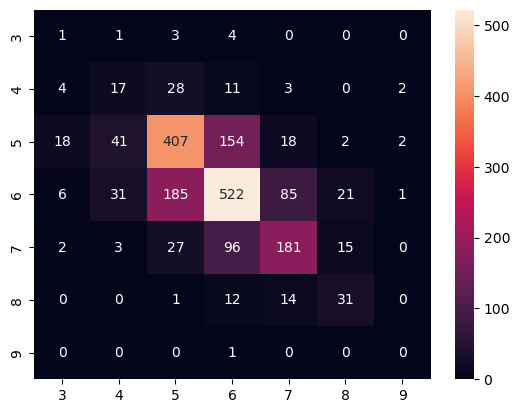

In [106]:
# Checking the performance of the support vector classifier.

con_matrix_svc=confusion_matrix(y_test_w, y_pred_svc)
sns.heatmap(data =con_matrix_svc,annot=True, cmap= 'rocket', fmt='.0f',xticklabels=[3,4,5,6,7,8,9], 
            yticklabels=[3,4,5,6,7,8,9])
plt.xticks()
plt.yticks()

precision_svc = precision_score(y_test_w, y_pred_svc, average='weighted')
recall_svc = recall_score(y_test_w, y_pred_svc, average='weighted')
accuracy_svc= accuracy_score(y_test_w, y_pred_svc)
f1_score_svc= f1_score(y_test_w, y_pred_svc,average='weighted')

print(f'Precision: {precision_svc:.4f}')
print(f'Recall: {recall_svc:.4f}')
print(f'Accuracy: {accuracy_svc:.4f}')
print(f'F1-score: {f1_score_svc:.4f}')


$\;\;\;\;\;\;$

## Decision Tree - Classification

 ### Built-in sklearn Classification Tree

In [110]:
# Applying Grid Search cross validation to find the best hyper-parameters combination.

para_ctree = {'criterion': ["gini", "entropy", "log_loss"],  
            'max_depth': [1,2,3,4],
           'max_features': ["auto", "sqrt", "log2"]}

gsearch_ctree = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),param_grid=para_ctree,scoring='accuracy',cv=5)
gsearch_ctree.fit(X_train_w, y_train_w)

gsearch_ctree.best_params_


/Users/salahjtaleb/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/salahjtaleb/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:547: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/salahjtaleb/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/salahjtaleb/opt/anaconda3/lib/python3.12/si

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4],
                         'max_features': ['auto', 'sqrt', 'log2']},
             scoring='accuracy')

{'criterion': 'gini', 'max_depth': 3, 'max_features': 'sqrt'}

In [111]:
#Using built-in Sklearn to build a classification Decision Tree model.

ctree = DecisionTreeClassifier(max_depth=4)
ctree.fit(X_train_w, y_train_w)
y_pred_ctree = ctree.predict(X_test_w)


DecisionTreeClassifier(max_depth=4)

<Axes: >

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0.5, 0, '3'),
  Text(1.5, 0, '4'),
  Text(2.5, 0, '5'),
  Text(3.5, 0, '6'),
  Text(4.5, 0, '7'),
  Text(5.5, 0, '8'),
  Text(6.5, 0, '9')])

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, '3'),
  Text(0, 1.5, '4'),
  Text(0, 2.5, '5'),
  Text(0, 3.5, '6'),
  Text(0, 4.5, '7'),
  Text(0, 5.5, '8'),
  Text(0, 6.5, '9')])

Precision: 0.4838
Recall: 0.5210
Accuracy: 0.5210
F1-score: 0.4961


/Users/salahjtaleb/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


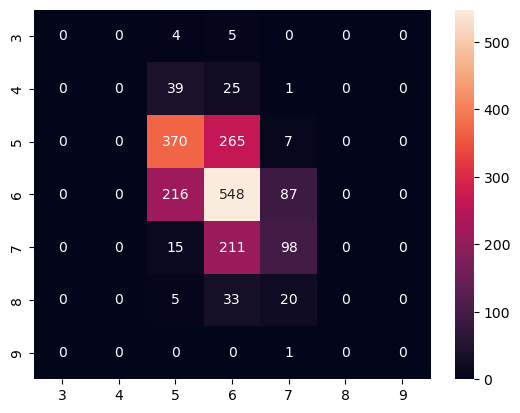

In [112]:
# Checking the performance of the Classification Tree model

con_matrix_ctree=confusion_matrix(y_test_w, y_pred_ctree)
sns.heatmap(data =con_matrix_ctree,annot=True, cmap= 'rocket', fmt='.0f',xticklabels=[3,4,5,6,7,8,9], 
            yticklabels=[3,4,5,6,7,8,9])
plt.xticks()
plt.yticks()

precision_ctree = precision_score(y_test_w, y_pred_ctree, average='weighted')
recall_ctree = recall_score(y_test_w, y_pred_ctree, average='weighted')
accuracy_ctree= accuracy_score(y_test_w, y_pred_ctree)
f1_score_ctree= f1_score(y_test_w, y_pred_ctree,average='weighted')

print(f'Precision: {precision_ctree:.4f}')
print(f'Recall: {recall_ctree:.4f}')
print(f'Accuracy: {accuracy_ctree:.4f}')
print(f'F1-score: {f1_score_ctree:.4f}')


In [113]:
fig, ax = plt.subplots(figsize = (95,80), dpi = 400)
plot_tree(ctree,filled= True, rounded=True, ax=ax , fontsize=40)

[Text(0.5, 0.9, 'x[10] <= -0.315\ngini = 0.672\nsamples = 4547\nvalue = [21.0, 151.0, 1496.0, 1985.0, 755.0, 135.0, 4.0]'),
 Text(0.25, 0.7, 'x[1] <= -0.393\ngini = 0.587\nsamples = 2106\nvalue = [10, 85, 1088, 793, 114, 16, 0]'),
 Text(0.125, 0.5, 'x[1] <= -0.621\ngini = 0.618\nsamples = 851\nvalue = [4, 19, 288, 429, 95, 16, 0]'),
 Text(0.0625, 0.3, 'x[0] <= -0.359\ngini = 0.615\nsamples = 515\nvalue = [4, 11, 131, 282, 72, 15, 0]'),
 Text(0.03125, 0.1, 'gini = 0.467\nsamples = 189\nvalue = [2, 1, 48, 129, 9, 0, 0]'),
 Text(0.09375, 0.1, 'gini = 0.674\nsamples = 326\nvalue = [2.0, 10.0, 83.0, 153.0, 63.0, 15.0, 0.0]'),
 Text(0.1875, 0.3, 'x[10] <= -0.79\ngini = 0.585\nsamples = 336\nvalue = [0.0, 8.0, 157.0, 147.0, 23.0, 1.0, 0.0]'),
 Text(0.15625, 0.1, 'gini = 0.57\nsamples = 218\nvalue = [0, 6, 118, 79, 15, 0, 0]'),
 Text(0.21875, 0.1, 'gini = 0.554\nsamples = 118\nvalue = [0, 2, 39, 68, 8, 1, 0]'),
 Text(0.375, 0.5, 'x[0] <= 2.187\ngini = 0.507\nsamples = 1255\nvalue = [6, 66, 800

$\;\;\;\;\;\;$

### Classification Tree implementation

In [116]:
class DecisionTreeClass:
    def __init__(self, max_depth=None, min_samples_split=100):
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split

    def grow_tree(self, X, y, depth=0):
        n_samples, n_features = X.shape
        classes = np.unique(y)

        # If all targets are the same, return the class label
        if len(classes) == 1:
            return {'class': classes[0]}

        # If not enough samples or max depth reached, return the most common class
        if n_samples < self.min_samples_split or  depth >= self.max_depth:
            return {'class': np.bincount(y).argmax()}

        best_CART = float('inf')
        best_split = None
        best_left = None
        best_right = None

        def CART(left, right):
            D1 = len(left)
            D2 = len(right)
            D = D1 + D2

            left_proportion = np.bincount(left, minlength=len(classes))
            right_proportion = np.bincount(right, minlength=len(classes))

            Gini_left = 1 - np.sum((left_proportion / D1) ** 2)   # Equation 9 in essay.
            Gini_right = 1 - np.sum((right_proportion / D2) ** 2)  # Equation 9 in essay.

            return (D1 / D) * Gini_left + (D2 / D) * Gini_right  # Equation 10 in essay.

        for feature in range(n_features):
            values = np.unique(X[:, feature])
            for t in values:
                left_indices = X[:, feature] <= t
                right_indices = X[:, feature] > t
                y_left = y[left_indices]
                y_right = y[right_indices]

                if len(y_left) == 0 or len(y_right) == 0:
                    continue

                cart = CART(y_left, y_right)
                if cart < best_CART:
                    best_CART = cart
                    best_split = (t, feature)
                    best_left = (y_left, left_indices)
                    best_right = (y_right, right_indices)

        if best_split is None:
            return {'class': np.bincount(y).argmax()}

        left_tree = self.grow_tree(X[best_left[1]], best_left[0], depth + 1)
        right_tree = self.grow_tree(X[best_right[1]], best_right[0], depth + 1)

        return {'feature': best_split[1],
                'value': best_split[0],
                'left': left_tree,
                'right': right_tree,
                'depth': depth}

In [117]:
tree_cl= DecisionTreeClass(max_depth=3)

In [118]:
# The threshold values choosen by the implemnted Tree almost matches those from the built-in Classification Tree

tree_cl.grow_tree(X_w, y_wine)

{'feature': 10,
 'value': -0.3285211095194689,
 'left': {'feature': 1,
  'value': -0.6357889778221769,
  'left': {'feature': 0,
   'value': -0.474651650909258,
   'left': {'class': 6},
   'right': {'class': 6},
   'depth': 2},
  'right': {'feature': 1,
   'value': -0.24094935769733491,
   'left': {'class': 5},
   'right': {'class': 5},
   'depth': 2},
  'depth': 1},
 'right': {'feature': 10,
  'value': 0.8174153305731634,
  'left': {'feature': 5,
   'value': -0.8747627819727997,
   'left': {'class': 6},
   'right': {'class': 6},
   'depth': 2},
  'right': {'feature': 10,
   'value': 1.6838550779602255,
   'left': {'class': 6},
   'right': {'class': 7},
   'depth': 2},
  'depth': 1},
 'depth': 0}